#Project Kuler
Github: https://github.com/hongsups/kuler
Blog: http://www.hongsup.com/kuler
<img src="files/img_vstm_stim.png"><p>
During my PhD, I ran human behavioral experiments to test visual memory. Sometimes the displays had colors. Participants always said my experiments looked so pretty. Although these colors were randomly chosen, I also found myself more aesthetically pleased with certain combinations of colors.
<p>
<img src="files/img_kuler_1.png">
<p>
<a href = "https://color.adobe.com/">Adobe Kuler</a> is a website where one can create, explore, and share a color theme consisting of five colors. Each color theme has a name ("Vitamin C", "Honey Pot", etc.). Users vote for prettier themes and anyone can download the information about any themes on the website. People use these themes for their presentations or product design. As of 2015, the website has thousands of color themes.
<p>
<img src="files/img_kuler_2.png">
<p>
I already knew about the Kuler long time ago, and have always wondered why certain color themes were more popular than the others. Also, it seems like there are some sort of patterns among popular themes. So, as a transition from neuroscience to data science, I decided to find the hidden relationship between colors across themes (namely, "Project Kuler"). As of July 2015, the work is still in progress. I found some interesting preliminary results using unsupervised learning. This iPython Notebook is to share my findings with public.

##I. Scraping the data
- [Using XML](https://github.com/hongsups/kuler/blob/master/kuler_scrape_xml.ipynb)
- [Using JSON response](https://github.com/hongsups/kuler/blob/master/kuler_scrape_json.ipynb)
<p>
Keys:
**author**, comment, **createAt**, **tags**, description, harmony, href, originalTheme, access, **like**, **view**, **rating**, **swatches (color)**, **name**, **id**, editedAt

##II. Cleaning the data
- [Clean and extract the data using pandas](https://github.com/hongsups/kuler/blob/master/kuler_cleaning_data.ipynb)
- [Convert color space from RGB to Lab](https://github.com/hongsups/kuler/blob/master/kuler_rgb_to_lab.ipynb)

##[III. Explore the non-color data](https://github.com/hongsups/kuler/blob/master/kuler_explore_non_color.ipynb)
- Check website activity
- Select a measure of user preference

##[IV. Visualize the color data in Lab space](https://github.com/hongsups/kuler/blob/master/kuler_vis_color_data.ipynb)

- Visualize all colors in one figure
- Sanity check: RGB vs. Lab
- Visualize a color theme

##[V. Implement user preference](https://github.com/hongsups/kuler/blob/master/kuler_pref.ipynb)
- Feature scaling
- Duplicate data based on popularity

##[VI. Clustering analysis](#6)
- [Feature selection](#6-1)
- [Run k-means clustering](#6-2)
- [Finding the right K](#6-3)
- [Visualize each theme in the same cluster](#6-4)
- [Visualize all themes in the same cluster](#6-5)

##[Future plans](http://www.hongsup.com/blog/2015/6/25/checkpoint-1)
- Analysis
    - Color anchors: what's it about the first and the last?
    - Clustering: dimensionality reduction, different features and algorithms
    - Find the formula: Gaussian approximation of the color clouds
- Visualization
    - Interactive color clouds
    - Color dominance
- Web application: recommender engine
    - Choice of colors
    - Choice of "mood" (word tags)
    - Better color rules

<a id= '6'></a>
##VI. Clustering analysis
<a id='6-1'></a>
###1. Feature selection
<b>Attempt 1</b>: Run a cluster analysis for each theme without considering the absolute colors and order. I discared this idea because sample size is too small to cluster each theme (n=5). For more details, read [here](http://www.hongsup.com/blog/2015/6/25/clustering-analysis).<p>
<b>Attempt 2</b>: Use 10D distance vector and ignore colors. This gives some decent clusters but it cannot capture complete spatial relationships between the colors. See [here](https://github.com/hongsups/kuler/blob/master/Project_Kuler.ipynb) for details.<p>
<b>Current version</b>: We now use L, a, and b coordinates from 5 colors in a theme, which results in 15D coordinate vector.

In [1]:
#Import modules
import numpy as np
import pandas as pd
from pandas import Series,DataFrame
import scipy as sp

# plotting
import seaborn as sns
sns.set(style="whitegrid")
import matplotlib.pyplot as plt
import matplotlib.cm as pltcm
%matplotlib inline

# colormath: color conversion and distance calculation
import colormath as cm

In [2]:
# Load data
df = pd.read_pickle('kuler_df')
# df_: color data only
# df_ = pd.read_pickle('kuler_df_')
# Preference-implemented data
df_ = pd.read_pickle('kuler_df_pref_v1')

In [3]:
df15D = df_.loc[:,df_.columns[5:]]
df15D.tail()

,L1,a1,b1,L2,a2,b2,L3,a3,b3,L4,a4,b4,L5,a5,b5
8542,36.080591,6.788230,-31.306032,75.689748,-27.651836,-2.942409,91.782976,-7.266719,-4.137015,99.999985,-0.000459,-0.008561,86.416740,14.041987,17.981608
8543,91.527972,1.084520,31.726765,64.858533,-32.845677,2.992858,27.151875,39.532472,-14.462896,14.444435,22.702966,-19.381893,6.104281,10.397559,-13.916812
8544,31.842798,10.837605,-23.648820,17.311990,20.889555,-21.748113,63.582575,-27.772164,32.633110,92.605212,-13.423365,73.827720,36.211544,4.797832,-5.502343
8545,12.614084,1.121895,4.954221,82.056621,-33.446031,49.123127,61.584068,-26.507752,35.302418,32.059979,-33.468727,38.105975,95.493544,-0.000442,-0.008229
8546,62.334001,-31.514076,-3.550759,74.956291,-17.114063,60.416013,92.468090,1.363467,7.027687,56.473847,62.452281,44.784061,43.364488,55.261039,41.611908


In [6]:
# 15D vector
data = df15D.values

<a id='6-2'></a>
###2. Run k-means clustering

In [7]:
def run_Kmeans(data,n_clusters,init='k-means++', n_init=10, max_iter=300):
    """ Take data as main input alongside with sklearn kmeans parameters 
        Gives labels, centroids, and kmeans as output
    """
    from sklearn import cluster
    kmeans = cluster.KMeans(n_clusters=n_clusters,init=init,n_init=n_init,max_iter=max_iter)
    kmeans.fit(data)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    return labels, centroids, kmeans

<a id ='6-3'></a>
###3. Finding the right K
<a id ='6-3-1'></a>
####3.1 Silhouette score

In [39]:
def run_s_score(data,range_n_clusters,init='k-means++', n_init=10, max_iter=300):
    """
        This codes is from sklearn cluster page. Modified by Hongsup Shin.
        It runs kmeans and computes silhouette score per K.
    """    
    
    from sklearn.metrics import silhouette_samples, silhouette_score
    import sklearn.cluster as cluster
    for n_clusters in range_n_clusters:
        
        # create a figure
        fig = plt.figure(figsize=(5,5))
        ax1 = fig.add_subplot(111)                 
        ax1.set_xlim([-0.2, 1]) # ax1: silhouette plot (values range from -1, 1)

        # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters
        ax1.set_ylim([0, len(data) + (n_clusters + 1) * 10])

        # run kmeans
        clusterer = cluster.KMeans(n_clusters=n_clusters,init=init,n_init=n_init,max_iter=max_iter)
        cluster_labels = clusterer.fit_predict(data)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(data, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(data, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = pltcm.spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhoutte score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])

        plt.show()

('For n_clusters =', 4, 'The average silhouette_score is :', 0.13366622837696904)


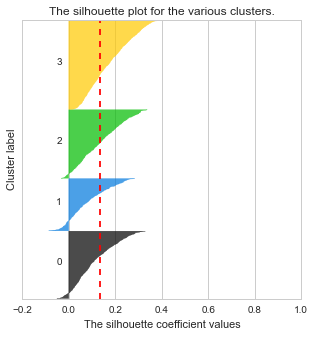

('For n_clusters =', 5, 'The average silhouette_score is :', 0.12495762238971653)


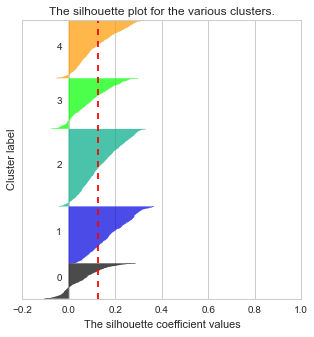

('For n_clusters =', 6, 'The average silhouette_score is :', 0.11749211300821373)


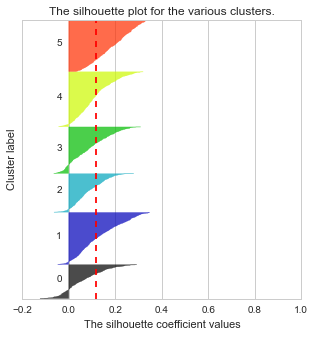

('For n_clusters =', 7, 'The average silhouette_score is :', 0.11902213535960317)


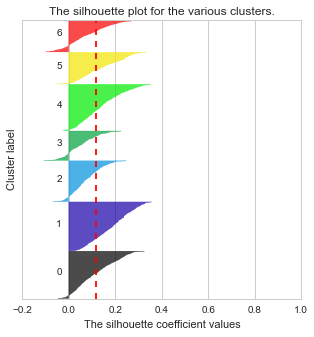

('For n_clusters =', 8, 'The average silhouette_score is :', 0.11707741479970138)


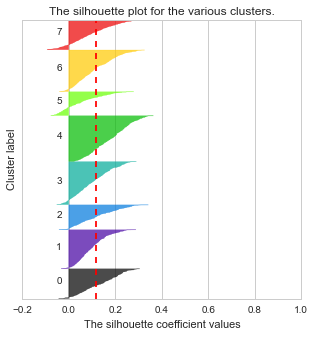

('For n_clusters =', 9, 'The average silhouette_score is :', 0.11831571568952903)


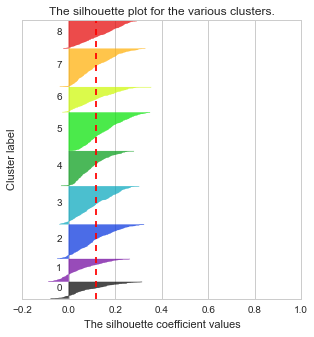

('For n_clusters =', 10, 'The average silhouette_score is :', 0.12134642990728275)


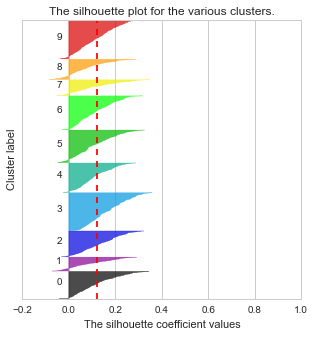

('For n_clusters =', 11, 'The average silhouette_score is :', 0.11771820068732851)


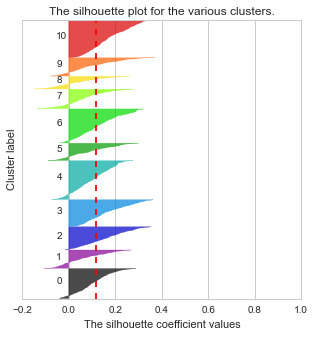

('For n_clusters =', 12, 'The average silhouette_score is :', 0.11851434356343284)


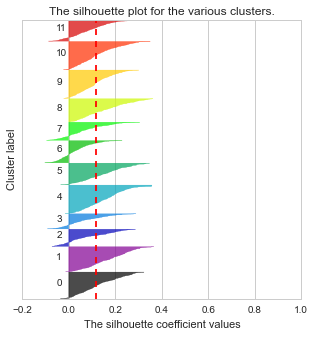

('For n_clusters =', 13, 'The average silhouette_score is :', 0.12537740035625483)


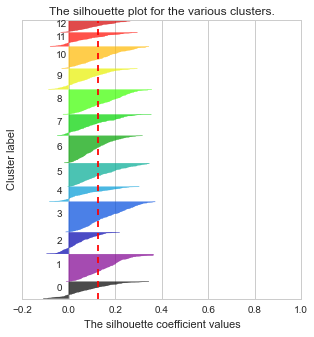

('For n_clusters =', 14, 'The average silhouette_score is :', 0.12247631189006354)


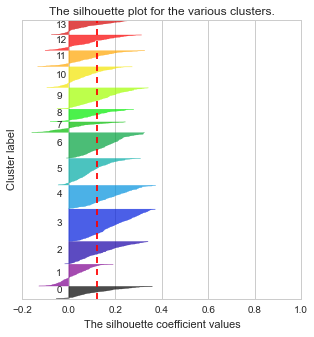

('For n_clusters =', 15, 'The average silhouette_score is :', 0.12546805086629914)


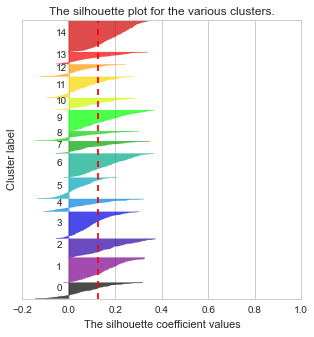

('For n_clusters =', 16, 'The average silhouette_score is :', 0.12491707838076145)


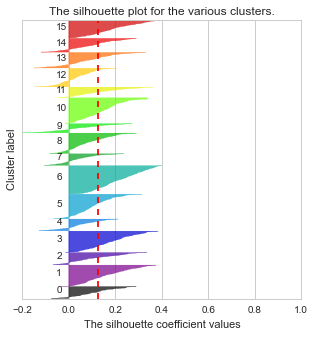

('For n_clusters =', 17, 'The average silhouette_score is :', 0.12588577699525269)


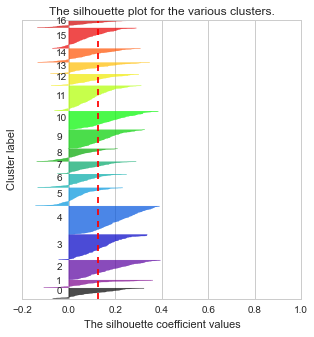

('For n_clusters =', 18, 'The average silhouette_score is :', 0.12839970137514314)


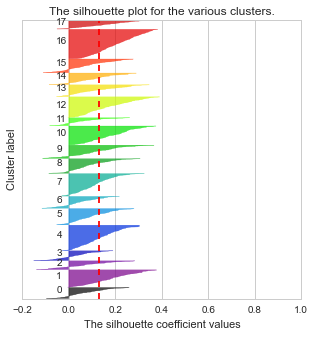

('For n_clusters =', 19, 'The average silhouette_score is :', 0.12702826497595462)


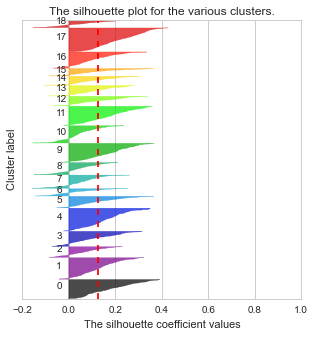

('For n_clusters =', 20, 'The average silhouette_score is :', 0.12104982481191714)


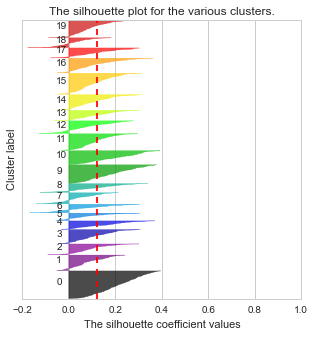

('For n_clusters =', 21, 'The average silhouette_score is :', 0.11319384104678)


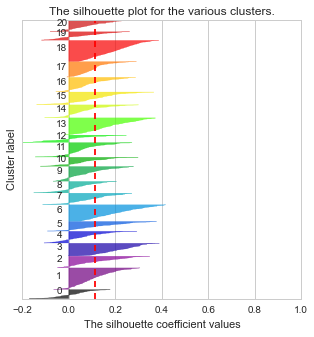

('For n_clusters =', 22, 'The average silhouette_score is :', 0.12521623157379547)


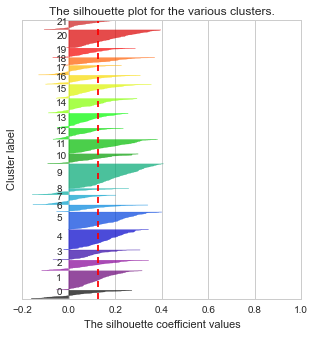

('For n_clusters =', 23, 'The average silhouette_score is :', 0.12121385706955914)


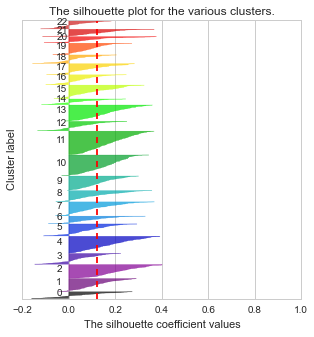

('For n_clusters =', 24, 'The average silhouette_score is :', 0.11323596593714871)


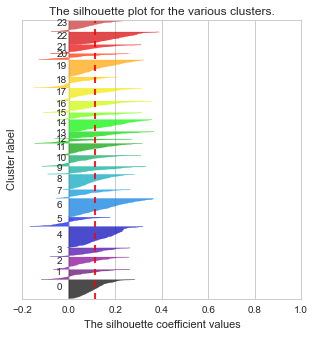

In [40]:
# compute silhouette score for k=4, ... , n_clusters
run_s_score(data,range(4,n_clusters+1))

There are clusters that have many samples with negative silhouette score (not good). The score is in general low. Possible reasons are that 1) we didn't find the right K (should increae K), 2) or just simply Kmeans is not a good clsutering method, or 3) our feature's high dimensionality. But after all, this method does not provide deterministic/definit quantitiative measure for selecting K.
<a id ='6-3-2'></a>
####3.2 AIC
According to [Introduction to Information Retrieval](http://nlp.stanford.edu/IR-book/html/htmledition/cluster-cardinality-in-k-means-1.html), AIC for kmeans can be computed by using intertia (RSS).

In [41]:
def plot_AIC_Kmeans(data,n_cluster_vec):
    """Compute AIC for each K in n_cluster_vec based on data, and plot AIC vs. K"""
    AIC_vec = []
    for n_cluster in n_cluster_vec:
        labels, centroids, kmeans = run_Kmeans(data,n_cluster,n_init=50)
        M = np.shape(data)[1]
        K = n_cluster
        RSS = kmeans.inertia_
        AIC = RSS + 2*M*K
        AIC_vec.append(AIC)    
    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(12, 6)
    ax.plot(n_cluster_vec, AIC_vec, marker = 'o', lw = 2)
    ax.set_title('AIC vlaues in KMeans (preference data)')
    ax.set_xlabel('Number of clusters (K)')
    ax.set_ylabel('AIC')  
    plt.show()        

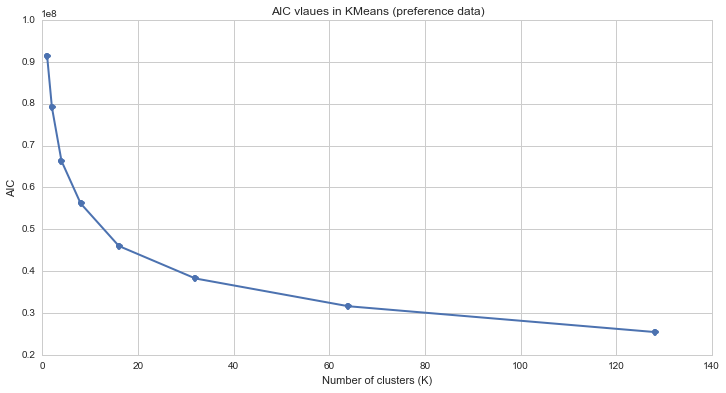

In [43]:
# Plot AIC for different Ks
n_cluster_vec = [2**x for x in range(8)]
plot_AIC_Kmeans(df15D,n_cluster_vec)

Because of high dimensionality of the data, AIC is dominated by the inertia and penalizing term (2MK, where M is feature dimensions, and K is the number of clusters) does not play a big role. Plus, the assumptions to use inertia instead of MLE are <b>if we view the model underlying  K-means as a Gaussian mixture with hard assignment, uniform cluster priors and identical spherical covariance matrices</b>, which is difficult to know and satisfy.

<a id='6-4'></a>
###4. Visualize each theme in the same cluster

In [44]:
# Example
n_clusters = 30
labels, centroids, kmeans = run_Kmeans(data,n_clusters)
labels

array([15, 29, 15, ...,  5, 11, 29], dtype=int32)

In [15]:
# %load plot_a_theme.py


# In[ ]:

"""Collection of functions for plotting a kuler theme in Lab space"""

def col_tuple2list(colormath_color):
    """Convert colormath to list"""
    color_list = []
    for i in range(3):
        color_list.append(colormath_color.get_value_tuple()[i])
    return color_list

def plot_scheme(schemeIdx,index1=0,index2=0):
    """ The 5 colors in each theme will be shown in a 3D space. 
        To show the ordinal properties of the colors, colors are connected with lines 
        Distance between colors is shown as text. 
        The first color is shown as a regular triangle.
        The last color is shown as an inverted triangle.
        The rest are shown as circles. """
    
    from mpl_toolkits.mplot3d import axes3d, Axes3D
    from colormath import color_diff
    from colormath.color_objects import LabColor, sRGBColor
    from colormath.color_conversions import convert_color

    # viewpoint
    if index1 == 'a' and index2 == 'b':
        el = 90
        az = -90
    elif index1 == 'L' and index2 == 'a':
        el = 0
        az = 90
    elif index1 == 'L' and index2 == 'b':
        el = 0
        az = 180
    elif int(index1) == 0 and int(index2) == 0:
        el = None
        az = None
        
    # draw a figure
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')

    # loop over the colors in a scheme
    for i in range(5):
        # df_ already has cm format(ex. Lab1) and list format (ex. L1, a1...)

        # 1. conver Lab color to sRGB for assigning colors for the plot
        LabColor_cm = df_['Lab'+str(i+1)][schemeIdx]
        sRGBColor_cm = convert_color(LabColor_cm,sRGBColor)

        # 2. convert this value to list for plotting
        sRGBColor_list = col_tuple2list(sRGBColor_cm)
        r = min(sRGBColor_list[0],1)
        g = min(sRGBColor_list[1],1)
        b = min(sRGBColor_list[2],1)
        color = np.array([[r,g,b],[0,0,0]])

        # 3. load the Lab coordinates
        L = df_['L'+str(i+1)][schemeIdx]
        a = df_['a'+str(i+1)][schemeIdx]
        b = df_['b'+str(i+1)][schemeIdx]        

        # 4. draw each color (first: triangle, last: reversed triangle, in-betweens: circle)
        marker_vec = ['^','o','o','o','v']
        ax.scatter(a,b,L,c=color,s=250,marker=marker_vec[i])
            
        # 5. draw lines between dots
        if i > 0:
            L_prev = df_['L'+str(i)][schemeIdx]
            a_prev = df_['a'+str(i)][schemeIdx]
            b_prev = df_['b'+str(i)][schemeIdx]        
            ax.plot([a_prev,a],[b_prev,b],[L_prev,L],color='black',alpha=0.2)

            # 6. compute distance between dots
            LabColor_cm_prev = LabColor(L_prev,a_prev,b_prev)
            diff = color_diff.delta_e_cie2000(LabColor_cm,LabColor_cm_prev)
            ax.text((a_prev+a)/2,(b_prev+b)/2,(L_prev+L)/2,'%.1f' %diff,(1,0,0))
            
    # view angle
    ax.view_init(elev=el,azim=az)

    # labels
    ax.set_xlabel('a')
    ax.set_ylabel('b')
    ax.set_zlabel('L')
    ax.set_xlim3d(-128, 128)
    ax.set_ylim3d(-128, 128)
    ax.set_zlim3d(0, 100)
    # show theme name and number of likes
    ax.set_title('#'+str(schemeIdx)+':'+df.name[schemeIdx]+' ('+str(df.Likes[schemeIdx])+')')

def plot_color_in_scheme(df_input,ax,colorIdx,schemeIdx,index1=0,index2=0):

    from mpl_toolkits.mplot3d import axes3d, Axes3D
    from colormath import color_diff
    from colormath.color_objects import LabColor, sRGBColor
    from colormath.color_conversions import convert_color
    
    # viewpoint
    if index1 == 'a' and index2 == 'b':
        el = 90
        az = -90
    elif index1 == 'L' and index2 == 'a':
        el = 0
        az = 90
    elif index1 == 'L' and index2 == 'b':
        el = 0
        az = 180
    elif int(index1) == 0 and int(index2) == 0:
        el = None
        az = None
        
        # 1. conver Lab color to sRGB for assigning colors for the plot
        LabColor_cm = df_input['Lab'+str(colorIdx)][schemeIdx]
        sRGBColor_cm = convert_color(LabColor_cm,sRGBColor)

        # 2. convert this value to list for plotting
        sRGBColor_list = col_tuple2list(sRGBColor_cm)
        r = min(sRGBColor_list[0],1)
        g = min(sRGBColor_list[1],1)
        b = min(sRGBColor_list[2],1)
        color = np.array([[r,g,b],[0,0,0]])

        # 3. load the Lab coordinates
        L = df_input['L'+str(colorIdx)][schemeIdx]
        a = df_input['a'+str(colorIdx)][schemeIdx]
        b = df_input['b'+str(colorIdx)][schemeIdx]        

        # 4. draw each color (first: triangle, last: reversed triangle, in-betweens: circle)
        ax.scatter(a,b,L,c=color,s=250,marker='o')
            
    # view angle
    ax.view_init(elev=el,azim=az)

    ax.set_xlabel('a')
    ax.set_ylabel('b')
    ax.set_zlabel('L')
    ax.set_xlim3d(-128, 128)
    ax.set_ylim3d(-128, 128)
    ax.set_zlim3d(0, 100)


# In[ ]:





In [16]:
def plot_scheme_Kmeans(labels,i):
    """Plot a color theme based on the label from kmeans results"""
    """WARNING: this takes up a lot of memory, so only plot portions"""
    indices = np.where(labels==i)
    print indices
    print len(indices)
    for j in range(len(indices[0])):
        plot_scheme(indices[0][j])

(array([  5,   6,  17,  26,  30,  46,  92, 111, 126, 132, 145, 146, 148,
       151, 163, 165, 182, 215, 217, 222, 244, 251, 271, 299, 312, 338,
       340, 347, 352, 369, 391, 408, 424, 450, 491]),)
1


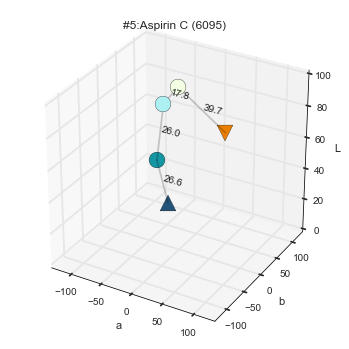

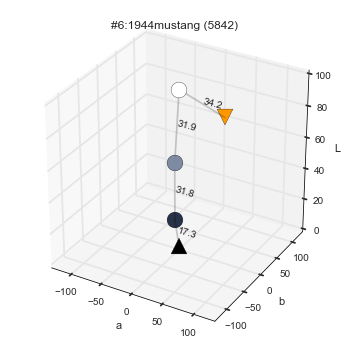

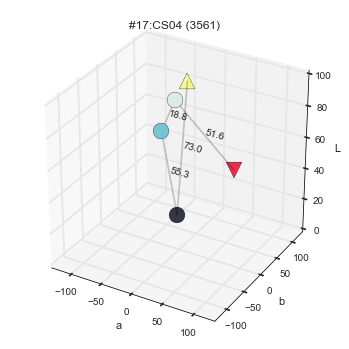

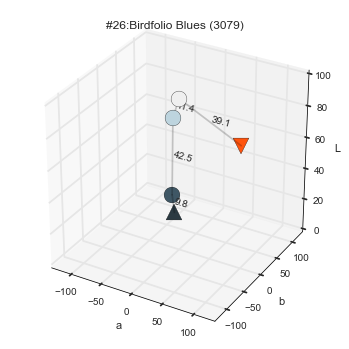

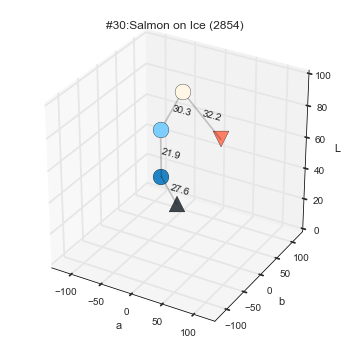

...

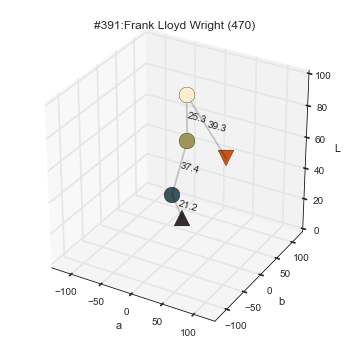

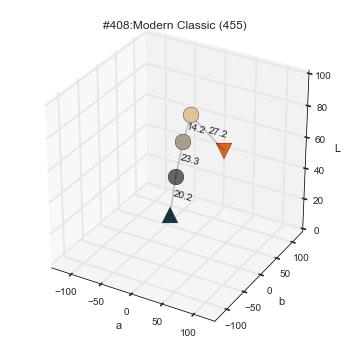

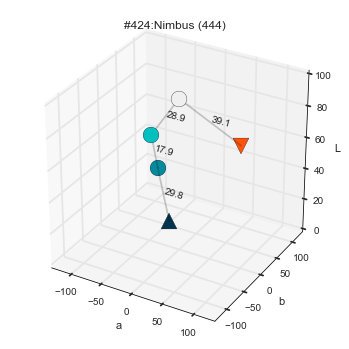

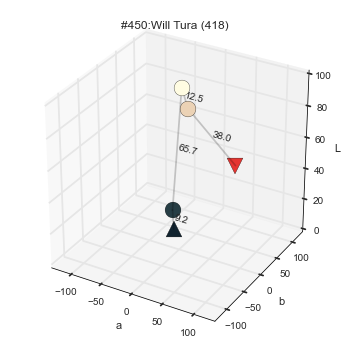

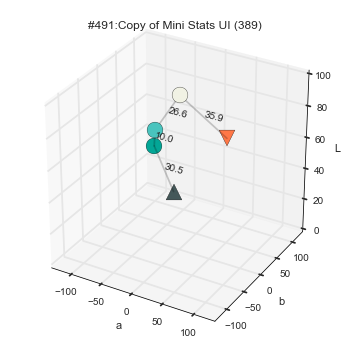

In [48]:
# Plot themes with label of 2 among the first 100 themes
clusterIdx = 0
plot_scheme_Kmeans(labels[:500],clusterIdx)

<a id='6-5'></a>
###5. Visualize all themes in the same cluster

In [18]:
def plot_Kmeans_collapsed(df_input,labels,clusterIdx,figsize=10):
    """
    This function collapses all themes belong to a cluster (clusterIdx).
    Then, draw 5 plots, each of which corresponds to nth color in the themes
    Ex. The 1st plot is all the 1st colors from the themes with a cluster (clusterIdx)
    """
    # load indices
    indices = np.where(labels==clusterIdx)
    #print indices # print the schemeIdx's of this cluster

    # plotting
    len_x = figsize*1
    len_y = figsize*5
    fig = plt.figure(figsize=(len_y,len_x))    
    
    for k in range(5):
        colorIdx = k+1
        ax = fig.add_subplot(1,5,k+1,projection='3d')
        for j in range(len(indices[0])):
            schemeIdx = indices[0][j]
            plot_color_in_scheme(df_input,ax,colorIdx,schemeIdx)  

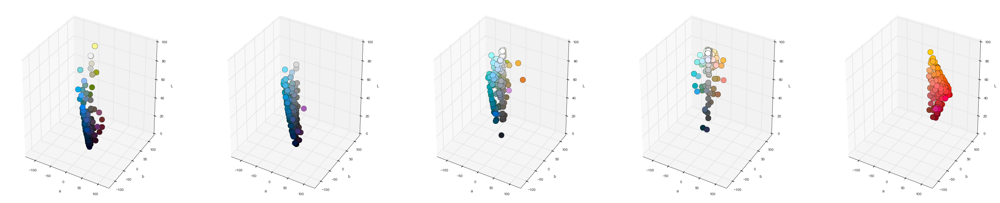

In [49]:
plot_Kmeans_collapsed(df_,labels,clusterIdx)

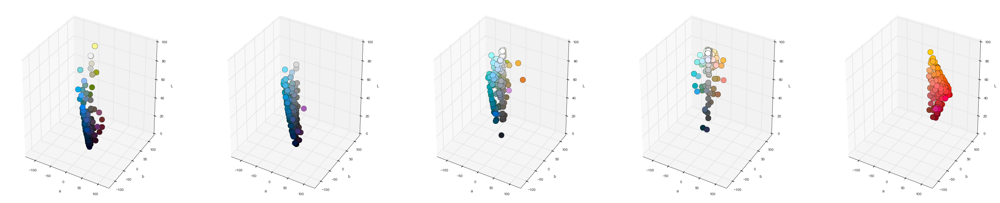

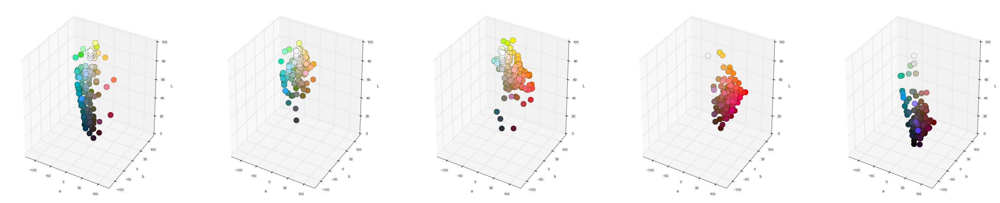

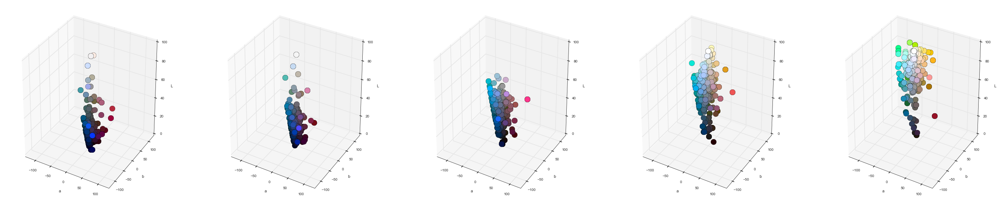

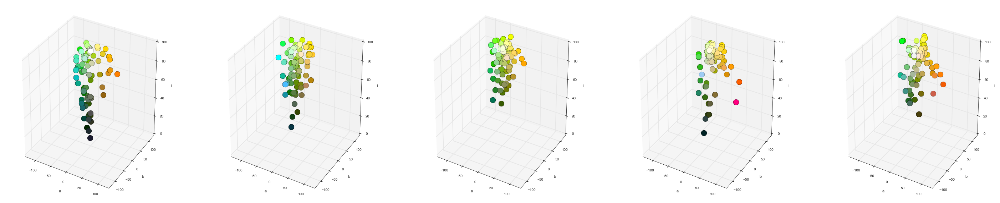

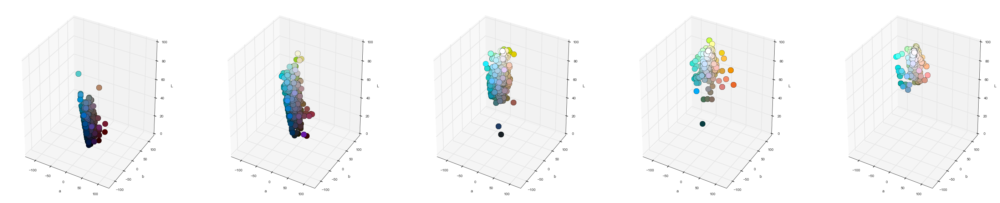

...

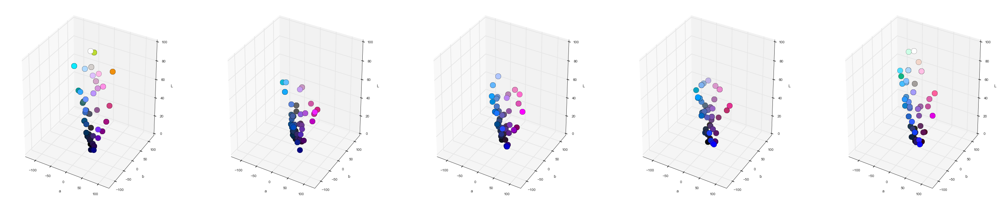

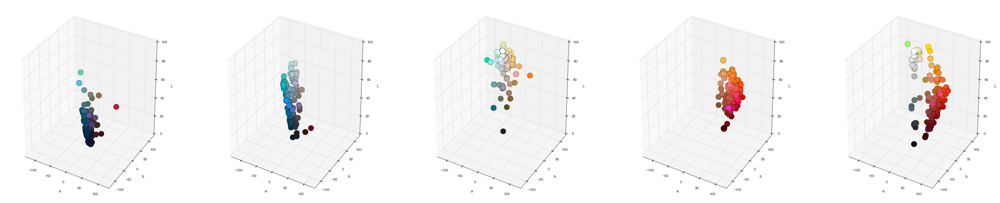

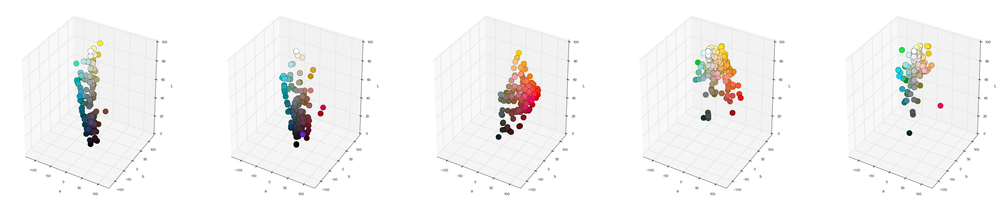

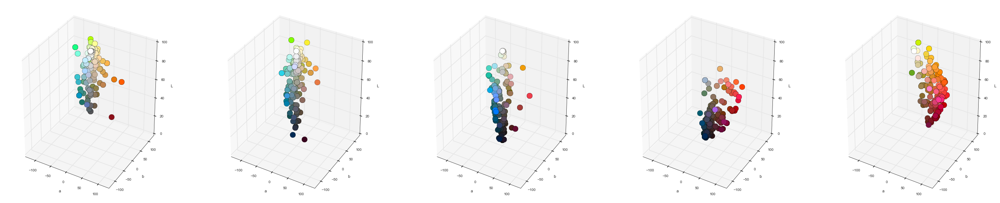

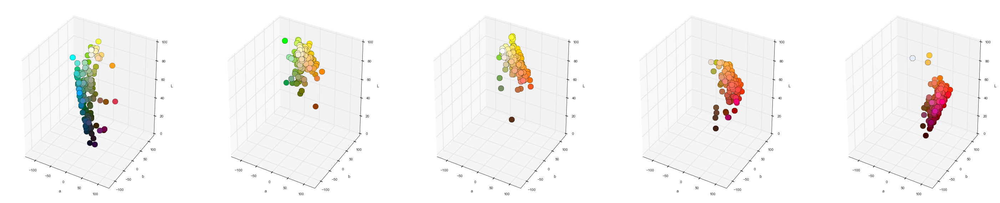

In [50]:
# Visualize all clusters in the same way
for i in range(n_clusters):
    plot_Kmeans_collapsed(df_,labels,i)